## **Assignment 5**

In [22]:
pip install geopandas

Note: you may need to restart the kernel to use updated packages.


In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [24]:
import folium
from folium.plugins import HeatMap

In [25]:
file_path = 'C:\\Users\\jamia\\MSDS 455\\Assignment 5\\Chicago_Crimes_2012_to_2017.csv'
crime_data = pd.read_csv(file_path)

In [26]:
print("Dataset Info:")
print(crime_data.info())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456714 entries, 0 to 1456713
Data columns (total 23 columns):
 #   Column                Non-Null Count    Dtype  
---  ------                --------------    -----  
 0   Unnamed: 0            1456714 non-null  int64  
 1   ID                    1456714 non-null  int64  
 2   Case Number           1456713 non-null  object 
 3   Date                  1456714 non-null  object 
 4   Block                 1456714 non-null  object 
 5   IUCR                  1456714 non-null  object 
 6   Primary Type          1456714 non-null  object 
 7   Description           1456714 non-null  object 
 8   Location Description  1455056 non-null  object 
 9   Arrest                1456714 non-null  bool   
 10  Domestic              1456714 non-null  bool   
 11  Beat                  1456714 non-null  int64  
 12  District              1456713 non-null  float64
 13  Ward                  1456700 non-null  float64
 14  Community Area      

In [27]:
print(crime_data.head())

   Unnamed: 0        ID Case Number                    Date  \
0           3  10508693    HZ250496  05/03/2016 11:40:00 PM   
1          89  10508695    HZ250409  05/03/2016 09:40:00 PM   
2         197  10508697    HZ250503  05/03/2016 11:31:00 PM   
3         673  10508698    HZ250424  05/03/2016 10:10:00 PM   
4         911  10508699    HZ250455  05/03/2016 10:00:00 PM   

                 Block  IUCR            Primary Type              Description  \
0   013XX S SAWYER AVE  0486                 BATTERY  DOMESTIC BATTERY SIMPLE   
1   061XX S DREXEL AVE  0486                 BATTERY  DOMESTIC BATTERY SIMPLE   
2  053XX W CHICAGO AVE  0470  PUBLIC PEACE VIOLATION         RECKLESS CONDUCT   
3    049XX W FULTON ST  0460                 BATTERY                   SIMPLE   
4    003XX N LOTUS AVE  0820                   THEFT           $500 AND UNDER   

  Location Description  Arrest  ...  Ward  Community Area  FBI Code  \
0            APARTMENT    True  ...  24.0            29.0      

In [28]:
crime_data = crime_data.dropna()
print(crime_data.isnull().sum())

Unnamed: 0              0
ID                      0
Case Number             0
Date                    0
Block                   0
IUCR                    0
Primary Type            0
Description             0
Location Description    0
Arrest                  0
Domestic                0
Beat                    0
District                0
Ward                    0
Community Area          0
FBI Code                0
X Coordinate            0
Y Coordinate            0
Year                    0
Updated On              0
Latitude                0
Longitude               0
Location                0
dtype: int64


In [29]:
print(crime_data.describe())

         Unnamed: 0            ID          Beat      District          Ward  \
count  1.418365e+06  1.418365e+06  1.418365e+06  1.418365e+06  1.418365e+06   
mean   3.273045e+06  9.574675e+06  1.150282e+03  1.125518e+01  2.285474e+01   
std    1.183059e+06  8.011218e+05  6.916395e+02  6.904508e+00  1.379378e+01   
min    3.000000e+00  2.022400e+04  1.110000e+02  1.000000e+00  1.000000e+00   
25%    2.696813e+06  8.987180e+06  6.130000e+02  6.000000e+00  1.000000e+01   
50%    3.052281e+06  9.575732e+06  1.024000e+03  1.000000e+01  2.300000e+01   
75%    3.409553e+06  1.019113e+07  1.711000e+03  1.700000e+01  3.400000e+01   
max    6.253474e+06  1.082334e+07  2.535000e+03  3.100000e+01  5.000000e+01   

       Community Area  X Coordinate  Y Coordinate          Year      Latitude  \
count    1.418365e+06  1.418365e+06  1.418365e+06  1.418365e+06  1.418365e+06   
mean     3.747455e+01  1.164399e+06  1.885510e+06  2.013851e+03  4.184144e+01   
std      2.142995e+01  1.843389e+04  3.413940

In [30]:
crime_counts = crime_data['Primary Type'].value_counts()
print("\nCrime Counts by Type:")
print(crime_counts)


Crime Counts by Type:
Primary Type
THEFT                                321950
BATTERY                              258941
CRIMINAL DAMAGE                      152812
NARCOTICS                            131177
ASSAULT                               89508
OTHER OFFENSE                         85361
BURGLARY                              81668
DECEPTIVE PRACTICE                    67609
MOTOR VEHICLE THEFT                   59856
ROBBERY                               56092
CRIMINAL TRESPASS                     36429
WEAPONS VIOLATION                     16983
PUBLIC PEACE VIOLATION                13015
OFFENSE INVOLVING CHILDREN            10590
PROSTITUTION                           7567
CRIM SEXUAL ASSAULT                    6298
INTERFERENCE WITH PUBLIC OFFICER       6136
SEX OFFENSE                            4491
HOMICIDE                               2590
GAMBLING                               2211
ARSON                                  2175
LIQUOR LAW VIOLATION                   1

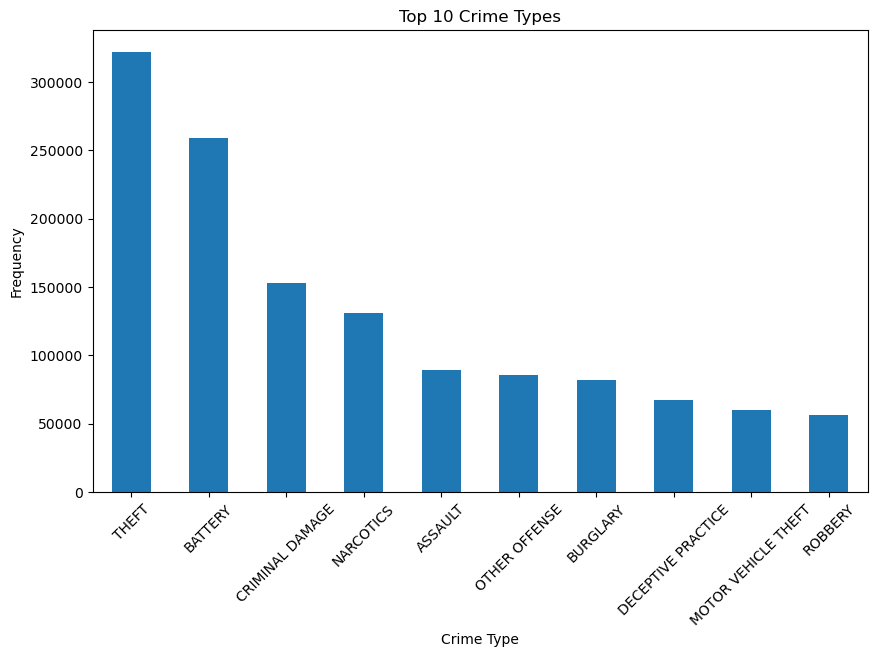

In [31]:
plt.figure(figsize=(10, 6))
crime_counts.head(10).plot(kind='bar')
plt.title('Top 10 Crime Types')
plt.ylabel('Frequency')
plt.xlabel('Crime Type')
plt.xticks(rotation=45)
plt.show()

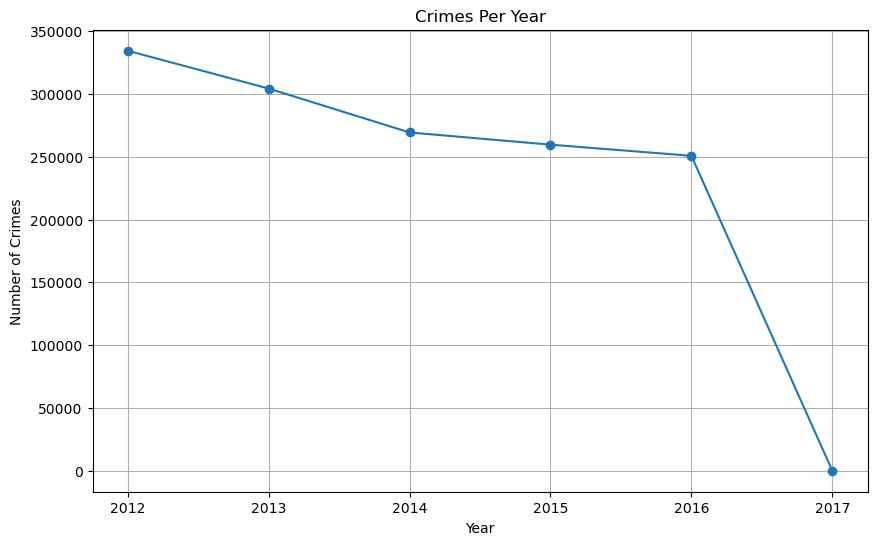

In [32]:
if 'Date' in crime_data.columns:
    crime_data['Date'] = pd.to_datetime(crime_data['Date'], format="%m/%d/%Y %I:%M:%S %p")
    crime_data['Year'] = crime_data['Date'].dt.year
    crime_data['Month'] = crime_data['Date'].dt.month

    crimes_by_year = crime_data['Year'].value_counts().sort_index()
    crimes_by_month = crime_data.groupby('Month').size()

    plt.figure(figsize=(10, 6))
    crimes_by_year.plot(kind='line', marker='o')
    plt.title('Crimes Per Year')
    plt.ylabel('Number of Crimes')
    plt.xlabel('Year')
    plt.grid()
    plt.show()

In [38]:
theft_data = crime_data[crime_data['Primary Type'] == 'THEFT']

theft_data = theft_data.dropna(subset=['Latitude', 'Longitude'])

MapOfChicago = folium.Map(location=[41.881832, -87.623177],
                         zoom_start=11)

Crimes = crime_data[crime_data["Primary Type"] == "THEFT"]
locations = crime_data.groupby('Community Area').first()
new_locations = locations.loc[:, ['Latitude', 'Longitude', 'Location Description', 'Arrest']]

for i in range(len(new_locations)):
    lat = new_locations.iloc[i][0]
    long = new_locations.iloc[i][1]
    popup_text = """Community Index : {}<br>
                Arrest : {}<br>
                Location Description : {}<br>"""
    popup_text = popup_text.format(new_locations.index[i],
                               new_locations.iloc[i][-1],
                               new_locations.iloc[i][-2]
                               )
    folium.CircleMarker(location = [lat, long], popup= popup_text, fill = True).add_to(MapOfChicago)
MapOfChicago

C:\Users\jamia\AppData\Local\Temp\ipykernel_19496\4162941563.py:15: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  lat = new_locations.iloc[i][0]
C:\Users\jamia\AppData\Local\Temp\ipykernel_19496\4162941563.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  long = new_locations.iloc[i][1]
C:\Users\jamia\AppData\Local\Temp\ipykernel_19496\4162941563.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  new_locations.iloc[i][-1],
C:\U

In [48]:
theft_data.head()

,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,...,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Month
4,911,10508699,HZ250455,2016-05-03 22:00:00,003XX N LOTUS AVE,0820,THEFT,$500 AND UNDER,RESIDENCE,False,...,25.0,06,1139890.0,1901675.0,2016,05/10/2016 03:56:50 PM,41.886297,-87.761751,"(41.886297242, -87.761750709)",5
12,2193,10508717,HZ250415,2016-05-03 17:30:00,011XX W JACKSON BLVD,0890,THEFT,FROM BUILDING,OTHER,False,...,28.0,06,1168776.0,1898793.0,2016,05/10/2016 03:56:50 PM,41.877812,-87.655758,"(41.877811861, -87.655758012)",5
13,2279,10508724,HZ250513,2016-05-03 09:00:00,028XX S DR MARTIN LUTHER KING JR DR,0820,THEFT,$500 AND UNDER,STREET,False,...,35.0,06,1179375.0,1886199.0,2016,05/10/2016 03:56:50 PM,41.843017,-87.617227,"(41.843016958, -87.61722727)",5
14,2477,10508728,HZ250505,2016-05-03 22:08:00,016XX N CLAREMONT AVE,0810,THEFT,OVER $500,STREET,False,...,24.0,06,1160444.0,1910787.0,2016,05/10/2016 03:56:50 PM,41.910901,-87.686019,"(41.910900826, -87.686018747)",5
16,3023,10508738,HZ250440,2016-05-03 21:45:00,020XX W LE MOYNE ST,0810,THEFT,OVER $500,STREET,False,...,24.0,06,1162515.0,1909832.0,2016,05/10/2016 03:56:50 PM,41.908237,-87.678437,"(41.908237096, -87.678437417)",5


In [49]:
from folium.plugins import HeatMap

theft_data = crime_data[crime_data['Primary Type'] == 'THEFT']

theft_data = theft_data.dropna(subset=['Latitude', 'Longitude'])

theft_counts = theft_data.groupby('Community Area').size().reset_index(name='Theft Count')

#geojson
geojson_file_path = 'C:\\Users\\jamia\\MSDS 455\\Assignment 5\\Boundaries - Neighborhoods.geojson'  
gdf = gpd.read_file(geojson_file_path)

#string type
gdf['sec_neigh'] = gdf['sec_neigh'].astype(str)  
theft_counts['Community Area'] = theft_counts['Community Area'].astype(str)  

gdf = gdf.merge(theft_counts, left_on='sec_neigh', right_on='Community Area', how='left')

#chi map
MapOfChicago = folium.Map(location=[41.881832, -87.623177], zoom_start=11)

heat_data = []
for index, row in theft_data.iterrows():
    # Ensure we are using valid data
    if pd.notna(row['Latitude']) and pd.notna(row['Longitude']):
        count = gdf[gdf['sec_neigh'] == row['Community Area']]['Theft Count'].values
        count = count[0] if len(count) > 0 else 0  # Ensure we get a valid theft count, default to 0 if not found
        heat_data.append([row['Latitude'], row['Longitude'], count])

HeatMap(heat_data).add_to(MapOfChicago)

MapOfChicago


ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

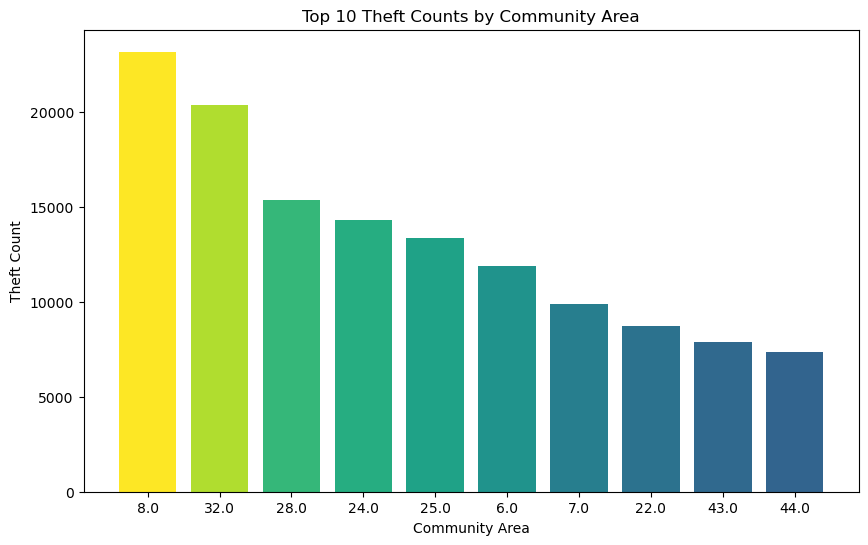

In [51]:
import matplotlib.pyplot as plt

top_10_thefts = theft_counts.sort_values(by='Theft Count', ascending=False).head(10)

plt.figure(figsize=(10, 6))
plt.bar(top_10_thefts['Community Area'], top_10_thefts['Theft Count'], color=plt.cm.viridis(top_10_thefts['Theft Count'] / max(top_10_thefts['Theft Count'])))
plt.title('Top 10 Theft Counts by Community Area')
plt.xlabel('Community Area')
plt.ylabel('Theft Count')
plt.colorbar(plt.cm.ScalarMappable(cmap='viridis'), label='Theft Intensity')
plt.xticks(rotation=45)  # Rotate the community area names for better readability
plt.show()
